
# https://colab.research.google.com/drive/18phbwA1iYG5VDGN2WjK7WrWYi-FdCHJ5
# Gamma Earth S2DR3 - Sentinel-2 Deep Resolution 3.0

## Effective 10-Band 10x Single Image Super-Resolution for Sentinel-2

The notebook showcases the performance of the S2DR3 module. Detailed description of the module, as well as performance analysis can be found in the following [white paper](https://medium.com/@ya_71389/c71a601a2253). Please contact info@gamma.earth for extended functionality, commercial use and other enquiries.

S2DR3 module will fetch Sentinel-2 data for the provided location and data and will super-resolve the 10 multispectral bands from the original 10m and 20m resolution to the targe spatial resolution of 1m/px. The output is a 10-band 1m/px multispectral georeferenced TIF image. The output product will be generated in the local filesystem path '/content/output' located here:

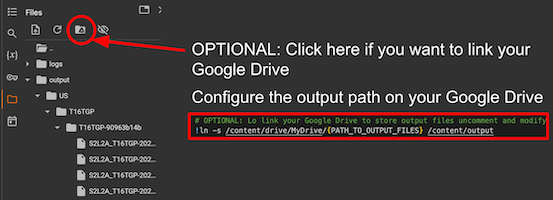

The output will contain 4 products:

*   S2L2Ax10_T[MGRS]-[DATE]-[UID]_MS.tif – 10-band multi-spectal image
*   S2L2Ax10_T[MGRS]-[DATE]-[UID]_TCI.tif – True colour RGB image
*   S2L2Ax10_T[MGRS]-[DATE]-[UID]_NDVI.tif – Pseudo-colour NDVI image
*   S2L2Ax10_T[MGRS]-[DATE]-[UID]_IRP.tif – Ifra-red preudo-colour image

The order of the 10 bands in the multi-spectral product is:
B02, B03, B04, B05, B06, B07, B08, B8A, B11, B12

# Installation

In [ ]:
import os
os.getcwd()
# Make sure to select T4 GPU instance from the Runtime/Change-runtime-type menu
# OPTIONAL: Lo link your Google Drive to store output files uncomment and modify the following line
#!ln -s /content/drive/MyDrive/{PATH_TO_OUTPUT_FILES} /content/output
!pip -q install https://storage.googleapis.com/0x7ff601307fa5/s2dr3-20250307.1-cp311-cp311-linux_x86_64.whl rasterio pyproj

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 34.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.1/140.1 kB 8.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 87.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 985.8/985.8 kB 43.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.4/26.4 MB 64.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.6/88.6 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.2/62.2 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.3/64.3 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 64.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24

# Download tiles using input DEM image as a template

In [ ]:
import math
import numpy as np
import rasterio
from pyproj import Transformer

def read_raster_info(dem_geotif_file_path:str, vertical_scale:float=0.05, dbg:int|bool=0):
    #gdalwarp -s_srs EPSG:3857 -t_srs EPSG:3857 -te 11520966.628110012 6956892.510042363 11539205.859441490 6975131.741373841 -ts 1107 1107 -r bilinear -of GTiff -co COMPRESS=DEFLATE DEM_SRC_PWM.tif ../../../../toolkit_install/IsaacLab/scripts/geo_dev/in/DEM_clipped_11km_square.tif
    if dbg: print(f"read_raster_info(): {dem_geotif_file_path}")
    with rasterio.open(dem_geotif_file_path) as src:
        utm_tran = Transformer.from_crs(src.crs, 'EPSG:32648', always_xy=True)
        geo_tran = Transformer.from_crs('EPSG:32648', 'EPSG:4326')
        dem_raw = src.read(1)  # Read as 2D NumPy array (elevation in meters)
        crs_bl = (src.bounds.left,  src.bounds.bottom)
        crs_tr = (src.bounds.right, src.bounds.top   )
        utm_bl = utm_tran.transform(crs_bl[0],  crs_bl[1])
        utm_tr = utm_tran.transform(crs_tr[0],  crs_tr[1])
        crs_dx = crs_tr[0] - crs_bl[0]
        crs_dy = crs_tr[1] - crs_bl[1]
        utm_dx = abs(utm_tr[0] - utm_bl[0])    # width of utm region in meters
        utm_dy = abs(utm_tr[1] - utm_bl[1])    # height of utm region in meters
        px_dx = abs(utm_dx / dem_raw.shape[0]) # width of pixel in meters
        py_dx = abs(utm_dy / dem_raw.shape[1]) # height of pixel in meters
        px_sz = int(dem_raw.shape[0])
        py_sz = int(dem_raw.shape[1])
        hf_scale = (1.0 / vertical_scale)
        stat_min = np.min(dem_raw)     # Used as sim floor = 0.0
        stat_avg = np.average(dem_raw) # Used as No Data value
        stat_max = np.max(dem_raw)
        # TODO: Checking if a -(px_dx/2.0) origin offset can improve GPS alignment in QGroundControl
        utm_cen_x = utm_bl[0] + (utm_dx/2.0) + (px_dx/1.0)
        utm_cen_y = utm_bl[1] + (utm_dy/2.0) + (py_dx/1.0)
        geo_cen = geo_tran.transform(utm_cen_x, utm_cen_y)
        info = {}
        info['utm_cen'] = (utm_cen_x, utm_cen_y) # tuple (easting, northing)
        info['geo_cen'] = geo_cen                # tuple (lat, lon)
        info['crs_res'] = src.res
        info['crs_size'] = (crs_dx, crs_dy)
        info['pix_size'] = (px_sz, py_sz)
        info['geo_size'] = (utm_dx, utm_dy) # TODO: INVESTIGATE non square aspect ratios
        info['geo_res'] = (px_dx, py_dx)
        info['bounds'] = src.bounds
        info['min_alt'] = stat_min
        info['avg_alt'] = stat_avg
        info['max_alt'] = stat_max
        info['cen_alt'] = float( dem_raw[int(px_sz/2)][int(py_sz/2)] )
        info['crs'] = src.crs
        info['z_step'] = hf_scale
        info['z_max'] = vertical_scale * (math.pow(2,16)-1)
        if(dbg):
            print(f"Resolution          (CRS): {info['crs_res']}")
            print(f"Resolution       (pixels): {info['pix_size'][0]} x {info['pix_size'][1]} ")
            print(f"Resolution (meters/pixel): {info['geo_res'][0]} x {info['geo_res'][1]} ")
            print(f"Geographic {info['bounds']}")
            print(f"CRS Size: {info['crs_size'][0]} m x {info['crs_size'][1]} m")
            print(f"Geo Size: {info['geo_size'][0]} m x {info['geo_size'][1]} m")
            print(f"UTM Cent | (East, North): ({info['utm_cen'][0]}, {info['utm_cen'][1]})")
            print(f"Geo Cent |    (lon, lat): ({info['geo_cen'][1]}, {info['geo_cen'][0]})")
            print(f"Height Min: {info['min_alt']} m")
            print(f"Height Avg: {info['avg_alt']} m")
            print(f"Height Max: {info['max_alt']} m")
            print(f"CRS: {info['crs']}")
            print(f"Sampled elevation at center: {info['cen_alt']} m (used as no_data value)")
            print(f"Quantized Height Feild Resolution: {info['z_step']} (per meter)")
            print(f"Z-Axis Max Output Range(0, {info['z_max']:.2f})")
        return info

tile_size = 3800.0 # 3.8 kilometers
ri = read_raster_info("DEM_clipped_15km_square.tif", dbg=1)
x_tile_count = math.ceil(ri['geo_size'][0] / tile_size)
y_tile_count = math.ceil(ri['geo_size'][1] / tile_size)
tile_count = x_tile_count * y_tile_count
print(f"Tile Grid Size: ({x_tile_count} x {y_tile_count})")
# manually estimated 2.18 minutes per 4km x 4km tile
print(f"Time estimate: {tile_count*2.18:.1f} minutes")
geo_tran = Transformer.from_crs(ri['crs'], 'EPSG:4326')
utm_origin = (ri['bounds'].left + (tile_size/2.0), ri['bounds'].bottom + (tile_size/2.0))
utm_curr = [ utm_origin[0], utm_origin[1] ]
utm_list = []
geo_list = []
index = 0
for x in range(x_tile_count):
    for y in range(y_tile_count):
        utm_curr[0] = utm_origin[0] + (x * tile_size)
        utm_curr[1] = utm_origin[1] + (y * tile_size)
        utm_list.append(utm_curr)
        geo_curr_inv = geo_tran.transform(utm_curr[0], utm_curr[1])
        # Need to flip order of lat / lon
        geo_curr = ( geo_curr_inv[1], geo_curr_inv[0] )
        geo_list.append(geo_curr)
        print(f"Tile #{index:03d} | x:{x:3d} y:{y:3d} | UTM: ({round(utm_curr[0]):9d},{round(utm_curr[1]):9d}) | WGS84: ({geo_curr[0]:3.10f},{geo_curr[1]:3.10f})")
        index += 1


read_raster_info(): DEM_clipped_15km_square.tif
Resolution          (CRS): (10.997067448680351, 10.997067448680351)
Resolution       (pixels): 1364 x 1364 
Resolution (meters/pixel): 10.997067448680351 x 10.997067448680351 
Geographic BoundingBox(left=396770.1, bottom=5855493.22, right=411770.1, top=5870493.22)
CRS Size: 15000.0 m x 15000.0 m
Geo Size: 15000.0 m x 15000.0 m
UTM Cent | (East, North): (404281.09706744866, 5863004.217067448)
Geo Cent |    (lon, lat): (103.57668725233975, 52.908174546876964)
Height Min: 396.0 m
Height Avg: 436.0891418457031 m
Height Max: 565.970458984375 m
CRS: EPSG:32648
Sampled elevation at center: 449.1849060058594 m (used as no_data value)
Quantized Height Feild Resolution: 20.0 (per meter)
Z-Axis Max Output Range(0, 3276.75)
Tile Grid Size: (4 x 4)
Time estimate: 19.2 - 28.8 minutes
Tile #000 | x:  0 y:  0 | UTM: (   398670,  5857393) | WGS84: (103.4950311646,52.8567226481)
Tile #001 | x:  0 y:  1 | UTM: (   398670,  5861193) | WGS84: (103.4938484437,

# Inference

0) Now Upscaling centered on:
  lon:103.49503116460981
  lat:52.856722648069095
Fetching data for T47UQU-7dcda54d3-20250605 .......... done. 
Processing S2L2A_T47UQU-7dcda54d3-20250605_MS . done 
Postprocessing S2L2A_T47UQU-7dcda54d3-20250605_MS ......... done

Find results at the following path: /content/output
Click the link below for preview:

https://gamayos.github.io/gamma-earth-api/s2dr3-demo-20250305.html?ds=RU-T47UQU-7dcda54d3-20250605#15/52.8567/103.4950



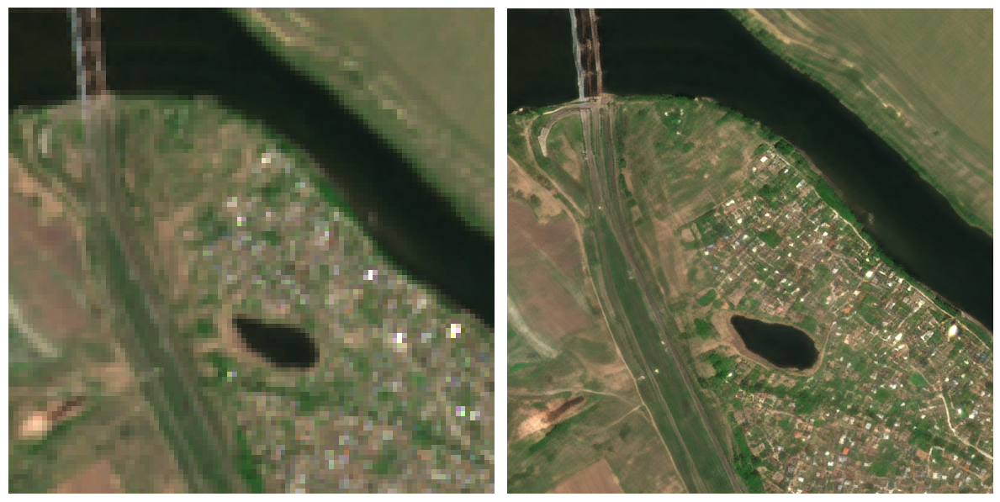


Done!
1) Now Upscaling centered on:
  lon:103.49384844372227
  lat:52.89087140944789
Fetching data for T47UQU-14a8fa068-20250605 .......... done. 
Processing S2L2A_T47UQU-14a8fa068-20250605_MS . done 
Postprocessing S2L2A_T47UQU-14a8fa068-20250605_MS ......... done

Find results at the following path: /content/output
Click the link below for preview:

https://gamayos.github.io/gamma-earth-api/s2dr3-demo-20250305.html?ds=RU-T47UQU-14a8fa068-20250605#15/52.8909/103.4938



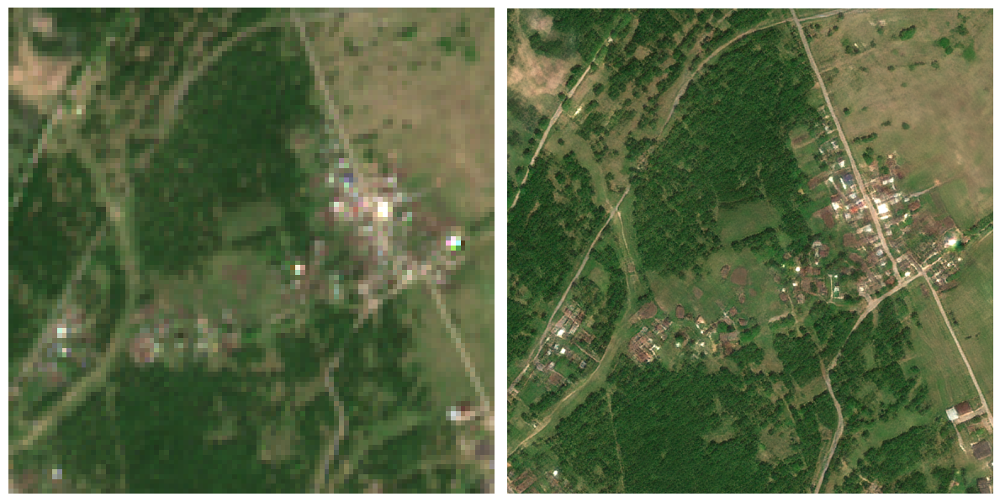


Done!
2) Now Upscaling centered on:
  lon:103.49266332818135
  lat:52.925019954778946
Fetching data for T47UQU-9d757a31c-20250605 .......... done. 
Processing S2L2A_T47UQU-9d757a31c-20250605_MS . done 
Postprocessing S2L2A_T47UQU-9d757a31c-20250605_MS ......... done

Find results at the following path: /content/output
Click the link below for preview:

https://gamayos.github.io/gamma-earth-api/s2dr3-demo-20250305.html?ds=RU-T47UQU-9d757a31c-20250605#15/52.9250/103.4927



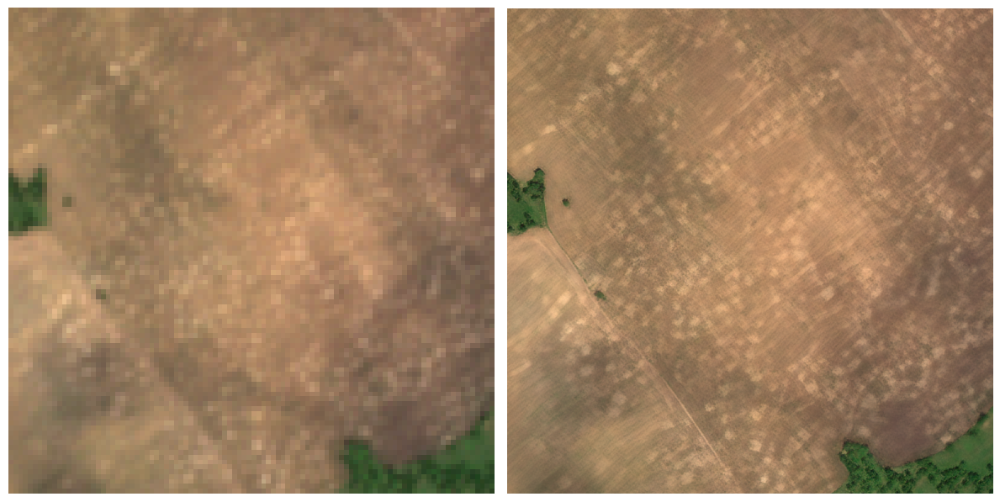


Done!
3) Now Upscaling centered on:
  lon:103.49147581149569
  lat:52.9591682840786
Fetching data for T47UQU-7148f40a4-20250605 .......... done. 
Processing S2L2A_T47UQU-7148f40a4-20250605_MS . done 
Postprocessing S2L2A_T47UQU-7148f40a4-20250605_MS ......... done

Find results at the following path: /content/output
Click the link below for preview:

https://gamayos.github.io/gamma-earth-api/s2dr3-demo-20250305.html?ds=RU-T47UQU-7148f40a4-20250605#15/52.9592/103.4915



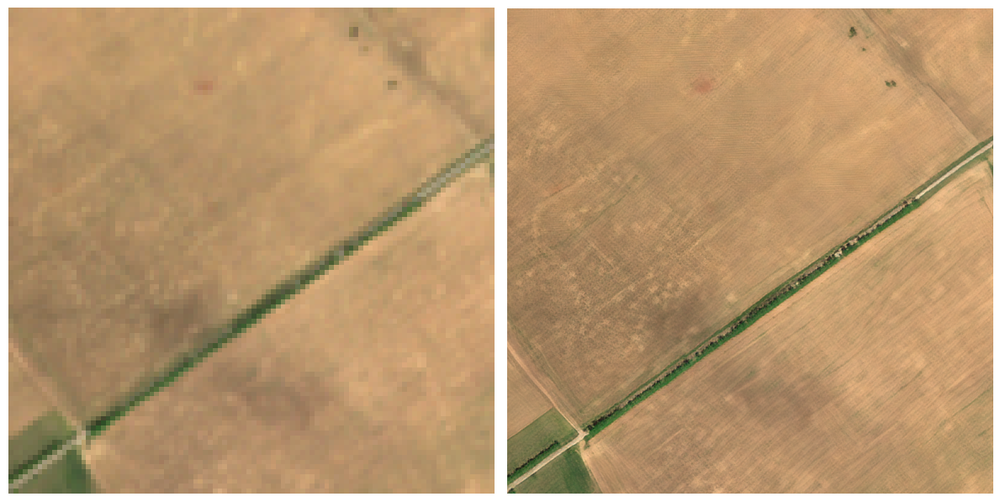


Done!
4) Now Upscaling centered on:
  lon:103.55144934971335
  lat:52.85742441951205
Fetching data for T47UQU-04fc4dccb-20250605 .......... done. 
Processing S2L2A_T47UQU-04fc4dccb-20250605_MS . done 
Postprocessing S2L2A_T47UQU-04fc4dccb-20250605_MS ......... done

Find results at the following path: /content/output
Click the link below for preview:

https://gamayos.github.io/gamma-earth-api/s2dr3-demo-20250305.html?ds=RU-T47UQU-04fc4dccb-20250605#15/52.8574/103.5514



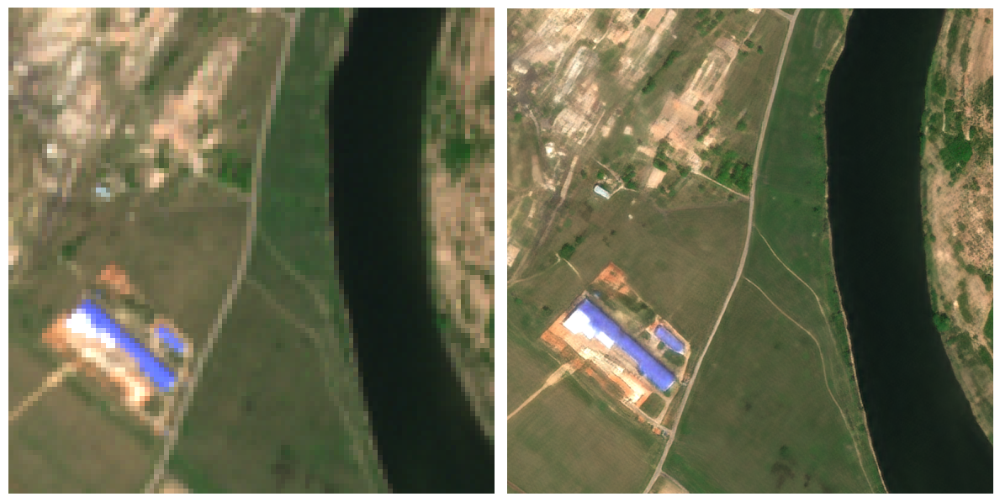


Done!
5) Now Upscaling centered on:
  lon:103.55031092802339
  lat:52.89157404516896
Fetching data for T47UQU-41d973eb8-20250605 .......... done. 
Processing S2L2A_T47UQU-41d973eb8-20250605_MS . done 
Postprocessing S2L2A_T47UQU-41d973eb8-20250605_MS ......... done

Find results at the following path: /content/output
Click the link below for preview:

https://gamayos.github.io/gamma-earth-api/s2dr3-demo-20250305.html?ds=RU-T47UQU-41d973eb8-20250605#15/52.8916/103.5503



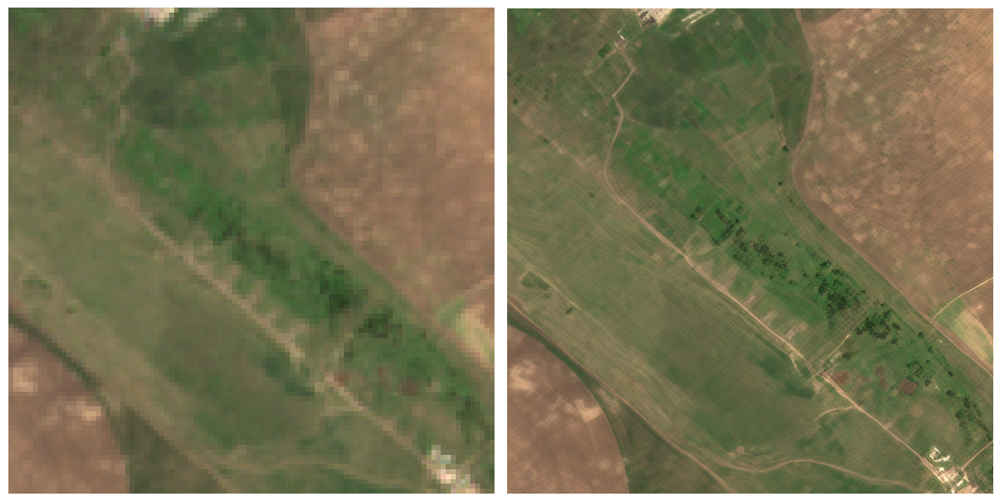


Done!
6) Now Upscaling centered on:
  lon:103.54917020128138
  lat:52.92572345613251
Fetching data for T47UQU-eb3ac0cd2-20250605 .......... done. 
Processing S2L2A_T47UQU-eb3ac0cd2-20250605_MS . done 
Postprocessing S2L2A_T47UQU-eb3ac0cd2-20250605_MS ......... done

Find results at the following path: /content/output
Click the link below for preview:

https://gamayos.github.io/gamma-earth-api/s2dr3-demo-20250305.html?ds=RU-T47UQU-eb3ac0cd2-20250605#15/52.9257/103.5492



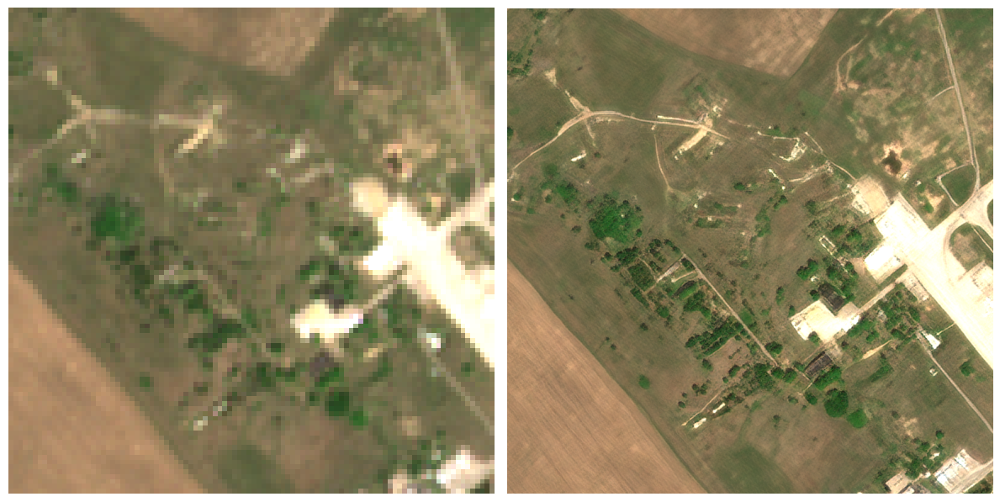


Done!
7) Now Upscaling centered on:
  lon:103.54802716323852
  lat:52.95987265242282
Fetching data for T47UQU-dc441c1af-20250605 .......... done. 
Processing S2L2A_T47UQU-dc441c1af-20250605_MS . done 
Postprocessing S2L2A_T47UQU-dc441c1af-20250605_MS ......... done

Find results at the following path: /content/output
Click the link below for preview:

https://gamayos.github.io/gamma-earth-api/s2dr3-demo-20250305.html?ds=RU-T47UQU-dc441c1af-20250605#15/52.9599/103.5480



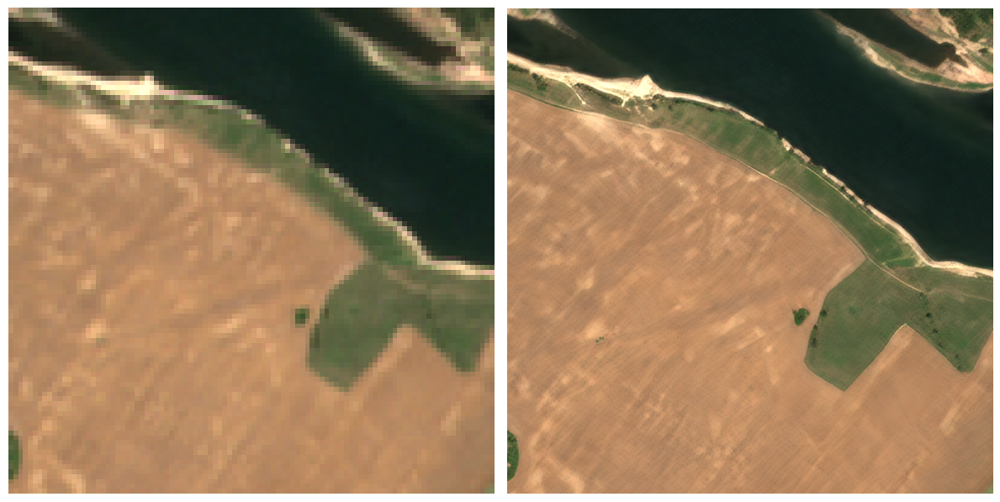


Done!
8) Now Upscaling centered on:
  lon:103.60786983363936
  lat:52.85809939155607
Fetching data for T48UUD-3ceeed758-20250605 .......... done. 
Processing S2L2A_T48UUD-3ceeed758-20250605_MS . done 
Postprocessing S2L2A_T48UUD-3ceeed758-20250605_MS ......... done

Find results at the following path: /content/output
Click the link below for preview:

https://gamayos.github.io/gamma-earth-api/s2dr3-demo-20250305.html?ds=RU-T48UUD-3ceeed758-20250605#15/52.8581/103.6079



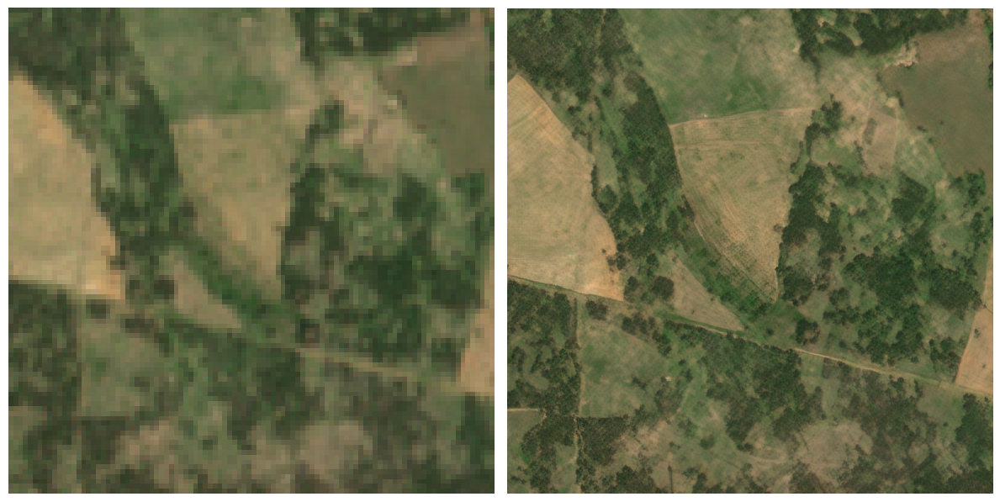


Done!
9) Now Upscaling centered on:
  lon:103.60677571737274
  lat:52.892249848512215
Fetching data for T48UUD-14f9aab16-20250605 .......... done. 
Processing S2L2A_T48UUD-14f9aab16-20250605_MS . done 
Postprocessing S2L2A_T48UUD-14f9aab16-20250605_MS ......... done

Find results at the following path: /content/output
Click the link below for preview:

https://gamayos.github.io/gamma-earth-api/s2dr3-demo-20250305.html?ds=RU-T48UUD-14f9aab16-20250605#15/52.8922/103.6068



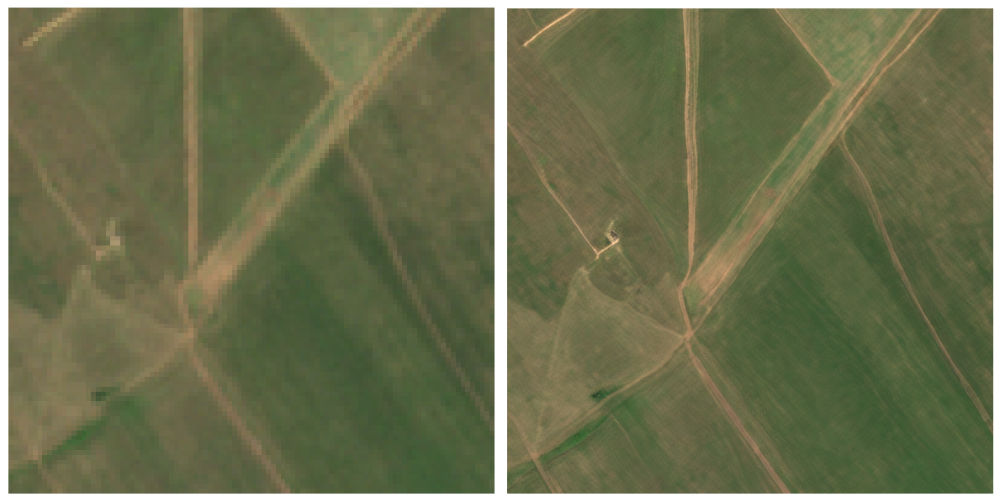


Done!
10) Now Upscaling centered on:
  lon:103.60567938567843
  lat:52.92640009207778
Fetching data for T48UUD-08809b3e6-20250605 .......... done. 
Processing S2L2A_T48UUD-08809b3e6-20250605_MS . done 
Postprocessing S2L2A_T48UUD-08809b3e6-20250605_MS ......... done

Find results at the following path: /content/output
Click the link below for preview:

https://gamayos.github.io/gamma-earth-api/s2dr3-demo-20250305.html?ds=RU-T48UUD-08809b3e6-20250605#15/52.9264/103.6057



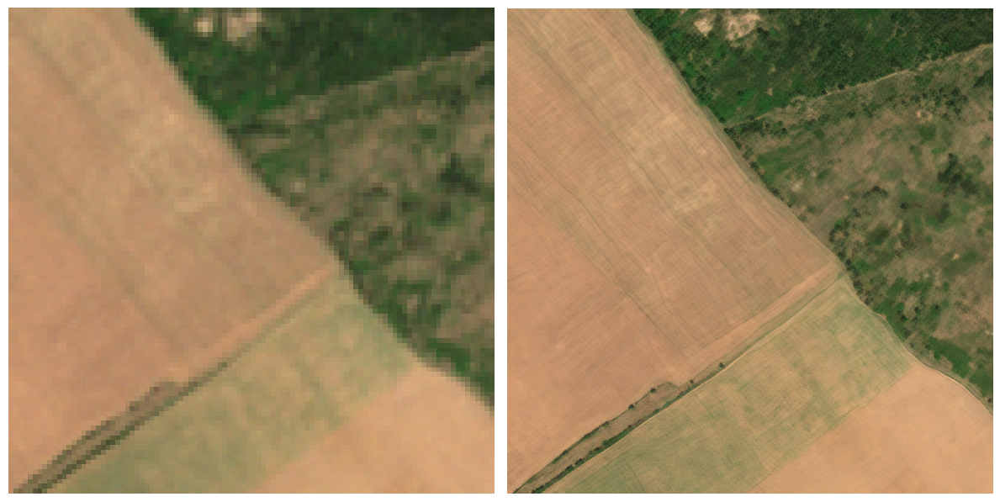


Done!
11) Now Upscaling centered on:
  lon:103.60458083255028
  lat:52.960550122276565
Fetching data for T48UUD-017c20d94-20250605 .......... done. 
Processing S2L2A_T48UUD-017c20d94-20250605_MS . done 
Postprocessing S2L2A_T48UUD-017c20d94-20250605_MS ......... done

Find results at the following path: /content/output
Click the link below for preview:

https://gamayos.github.io/gamma-earth-api/s2dr3-demo-20250305.html?ds=RU-T48UUD-017c20d94-20250605#15/52.9606/103.6046



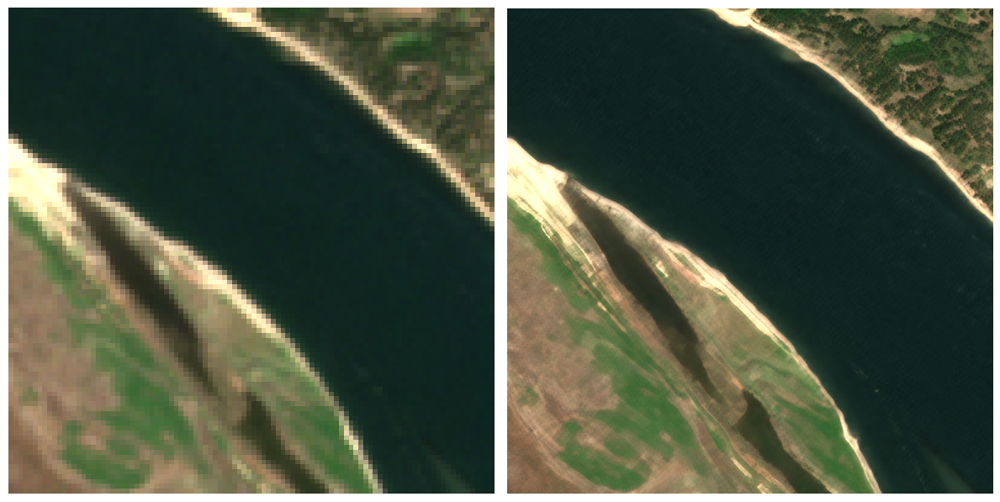


Done!
12) Now Upscaling centered on:
  lon:103.66429252700534
  lat:52.85874756176898
Fetching data for T48UVD-c3f194452-20250605 .......... done. 
Processing S2L2A_T48UVD-c3f194452-20250605_MS . done 
Postprocessing S2L2A_T48UVD-c3f194452-20250605_MS ......... done

Find results at the following path: /content/output
Click the link below for preview:

https://gamayos.github.io/gamma-earth-api/s2dr3-demo-20250305.html?ds=RU-T48UVD-c3f194452-20250605#15/52.8587/103.6643



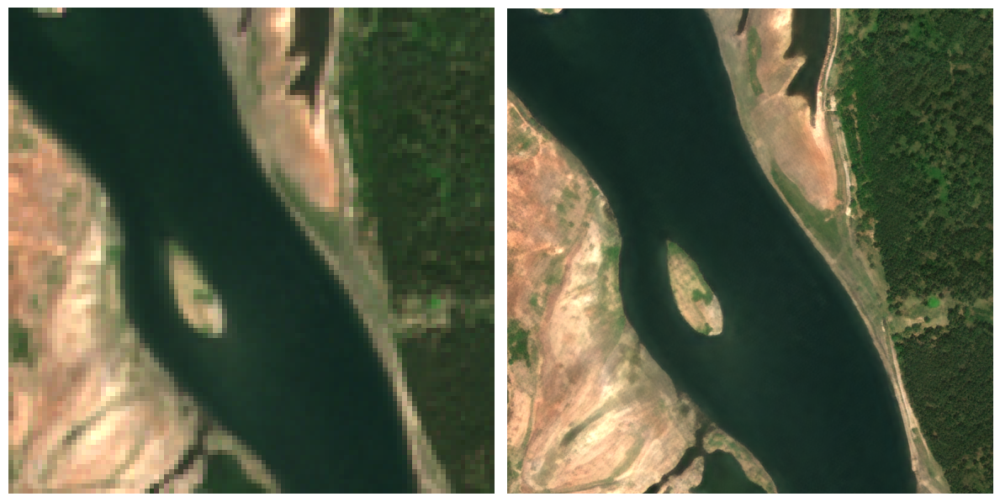


Done!
13) Now Upscaling centered on:
  lon:103.66324272214604
  lat:52.89289881703941
Fetching data for T48UVD-fb31371df-20250605 .......... done. 
Processing S2L2A_T48UVD-fb31371df-20250605_MS . done 
Postprocessing S2L2A_T48UVD-fb31371df-20250605_MS ......... done

Find results at the following path: /content/output
Click the link below for preview:

https://gamayos.github.io/gamma-earth-api/s2dr3-demo-20250305.html?ds=RU-T48UVD-fb31371df-20250605#15/52.8929/103.6632



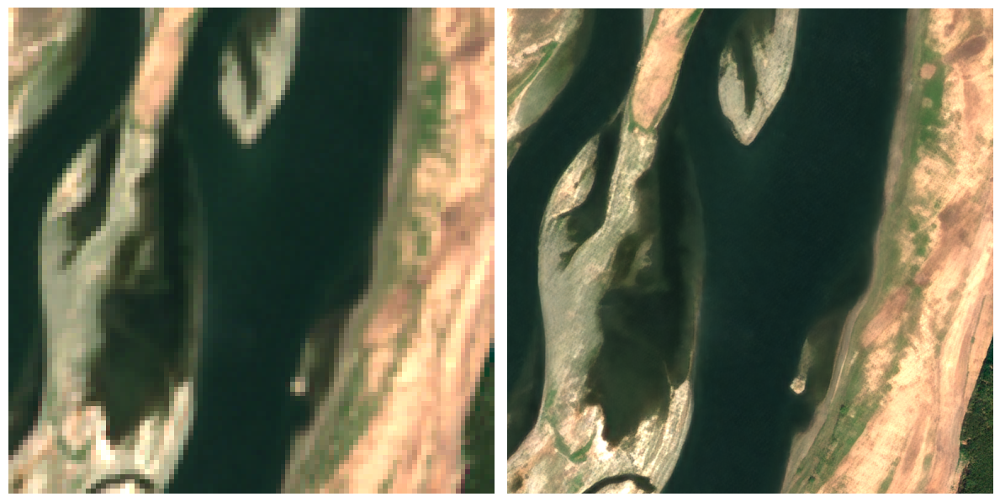


Done!
14) Now Upscaling centered on:
  lon:103.66219079150561
  lat:52.92704986017043
Fetching data for T48UVD-b304a494c-20250605 .......... done. 
Processing S2L2A_T48UVD-b304a494c-20250605_MS . done 
Postprocessing S2L2A_T48UVD-b304a494c-20250605_MS ......... done

Find results at the following path: /content/output
Click the link below for preview:

https://gamayos.github.io/gamma-earth-api/s2dr3-demo-20250305.html?ds=RU-T48UVD-b304a494c-20250605#15/52.9270/103.6622



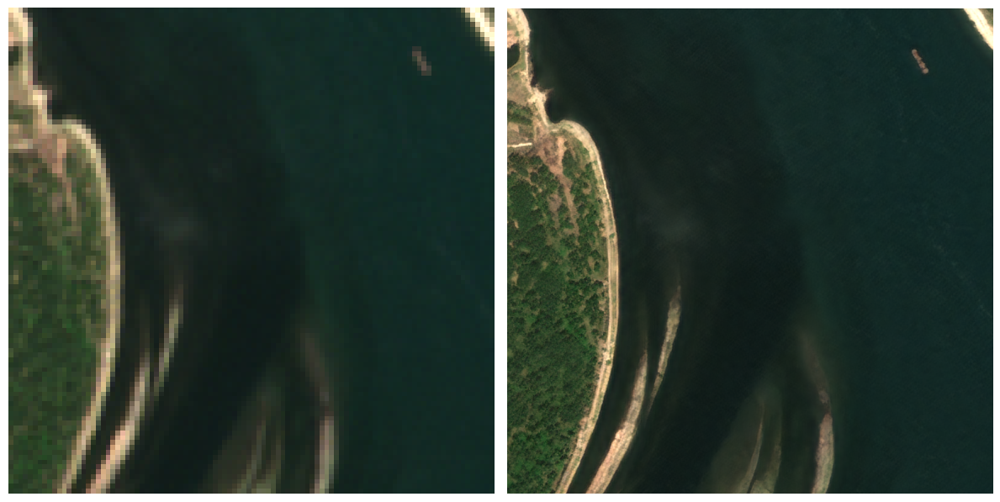


Done!
15) Now Upscaling centered on:
  lon:103.6611367293206
  lat:52.9612006911894
Fetching data for T48UVD-7d64e1462-20250605 .......... done. 
Processing S2L2A_T48UVD-7d64e1462-20250605_MS . done 
Postprocessing S2L2A_T48UVD-7d64e1462-20250605_MS ......... done

Find results at the following path: /content/output
Click the link below for preview:

https://gamayos.github.io/gamma-earth-api/s2dr3-demo-20250305.html?ds=RU-T48UVD-7d64e1462-20250605#15/52.9612/103.6611



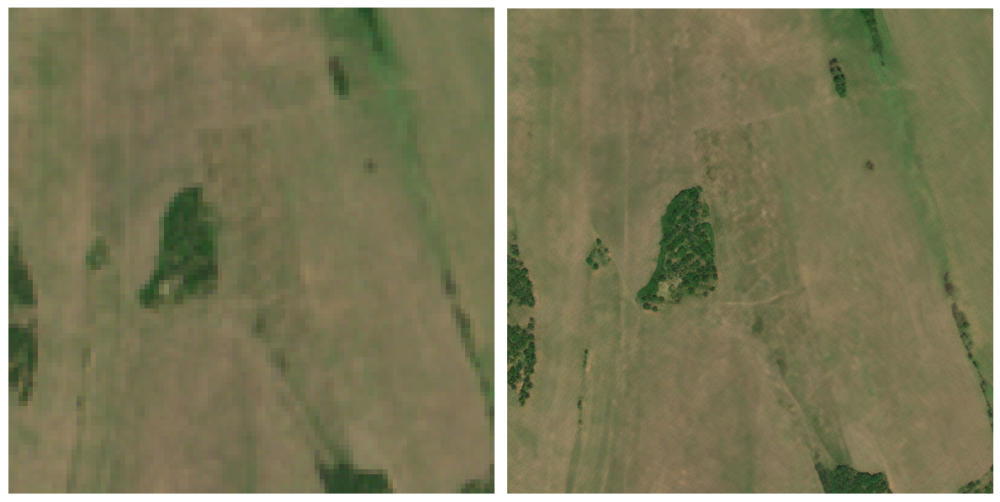


Done!


In [12]:
import s2dr3.inferutils

!rm -rf output/*

# NOTE THE X,Y FORMAT!
# Specify the target date. Please note, S2DR3 model will process the date
# from the Sentinel-2 catalogue that is closest to the specified date.
# Selected date may be ocluded by clouds. Please consult the Copernucus
# Dataspace for data availability https://browser.dataspace.copernicus.eu
# Archive images are available from 2018-01-01.
date = '2025-06-05'

# Due to high demand, the preview link may take some time to load.
# !!!Please note: the image below is just a small sample intended to indicate
# successful complition of the inference. Click the generated preview link
# to see the actual results.
cnt = 0
for lonlat in geo_list:
  print(f"{cnt}) Now Upscaling centered on:\n  lon:{lonlat[0]}\n  lat:{lonlat[1]}")
  s2dr3.inferutils.test(lonlat, date)
  print("Done!")
  cnt += 1


In [ ]:
# The download is huge ~5.6GB and will be downloadable: /content/output/
# this will take a while
!cd /content/output && zip -rq S2DR3_Output.zip *

# License

Copyright (c) Gamma Earth Sarl

The software is provided for testing, performance evaluation and validation. All rights are reserved by the copyright owner. For extended functionality and commercial use please contact info@gamma.earth

Please use the following citation for S2DR3-related academic publications:

Yosef Akhtman, S2DR3: Effective 10-Band 10x Single Image Super-Resolution for Sentinel-2. Medium: https://medium.com/@ya_71389/c71a601a2253

Please note that selected satellite images generated by anonymous users may be reused for publicity.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE
SOFTWARE